# Deep Learning for NLP - Exercise 04
In this exercise, we will first look at the inner workings of the attention mechanism and the importance of various heads in pretrained models. The second task compares multiple decoding strategies on the same model and prompt to highlight how much on an effect the decoding algorithm has on the quality of generated text.

Task 1 and Task 2 can be worked in independently.
___

General hints:
* Have a look at the imports below when solving the tasks
* Use the given modules and all submodules of the imports, but don't import anything else!
    * For instance, you can use other functions under the `torch` or `nn` namespace, but don't import e.g. PyTorch Lightning, etc.
* It is recommended to install all packages from the provided environment file
* Feel free to test your code between sub-tasks of the exercise sheet, so that you can spot mistakes early (wrong shapes, impossible numbers, NaNs, ...)
* Just keep in mind that your final submission should be compliant to the provided initial format of this file

Submission guidelines:
* Make sure that the code runs on package versions from the the provided environment file
* Do not add or change any imports (also don't change the naming of imports, e.g. `torch.nn.functional as f`)
* Remove your personal, additional code testings and experiments throughout the notebook
* Do not change the class, function or naming structure as we will run tests on the given names
* Additionally export this notebook as a `.py` file, and submit **both** the executed `.ipynb` notebook with plots in it **and** the `.py` file
* **Deviation from the above guidelines will result in partial or full loss of points**

In [1]:
 !pip install transformers==4.24.0
 !pip install datasets==3.0.1
 !pip install bertviz==1.4.0
 !pip install plotly==5.17.0

# Task 1: Looking 'Inside' the Models

In [2]:
import numpy as np
import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt
from bertviz import head_view, model_view

import torch

from datasets import load_dataset
from transformers import (
    AutoTokenizer,
    AutoModel,
    AutoModelForSequenceClassification,
    BertConfig,
)

## Task 1.1: Visualizing and Analyzing Attention Maps

* In the following experiment, we compare three models: a randomly initialized BERT model, and trained BERT model, and a trained GPT-2 model
* Start by loading a randomly initialized BERT model
    * You can achieve this by loading an [AutoModelForSequenceClassification.from_config](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForSequenceClassification.from_config)
    * Make use of the imported `BertConfig`
    * Specify `output_attentions=True`
* Repeat the process for pre-trained BERT and GPT-2
    * For pre-trained BERT, load [bhadresh-savani/bert-base-uncased-emotion](https://huggingface.co/bhadresh-savani/bert-base-uncased-emotion) using [AutoModelForSequenceClassification.from_pretrained](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForSequenceClassification.from_pretrained)
    * For GPT-2, it is enough to use [AutoModel.from_pretrained](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModel.from_config) method
        * This model will not have a language modelling head ontop, but only return hidden states. Since we are only interested in attention outputs, this is enough in this case
    * Also specify `output_attentions=True` for both
* Set all models into `eval()` mode
* Load BERT's and GPT2's tokenizer accordingly using the `AutoTokenizer` import

In [3]:
gpt_model_name = 'gpt2'
bert_model_name = "bhadresh-savani/bert-base-uncased-emotion"

rnd_bert = AutoModelForSequenceClassification.from_config(BertConfig(output_attentions=True))
rnd_bert.eval()

bert = AutoModelForSequenceClassification.from_pretrained(bert_model_name)
bert.eval()
bert.config.output_attentions = True

gpt2 = AutoModelForSequenceClassification.from_pretrained(gpt_model_name)
gpt2.eval()
gpt2.config.output_attentions = True

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of GPT2ForSequenceClassification were not initialized from the model checkpoint at gpt2 and are newly initialized: ['score.weight']
You should probably TRAIN this model on a down-stream 

In [4]:
tokenizer_bert = AutoTokenizer.from_pretrained(bert_model_name, add_special_tokens=True, return_tensors = "pt")
tokenizer_gpt = AutoTokenizer.from_pretrained(gpt_model_name, add_special_tokens=True,return_tensors = "pt")

* Encode the sentence using both tokenizers
    * Return the sentences as torch tensors
* Save the tokenized sequence as a list of strings in a variable (required for plotting below)

In [5]:
sentence = "I was so relieved after the phone call yesterday. I smiled the whole day."

bert_sentence = tokenizer_bert(sentence, return_tensors = "pt")
gpt_sentence = tokenizer_gpt(sentence, return_tensors = "pt")

tokens_bert = tokenizer_bert.convert_ids_to_tokens(bert_sentence["input_ids"][0])
tokens_gpt = tokenizer_gpt.convert_ids_to_tokens(gpt_sentence["input_ids"][0])

output_sentences = [tokens_bert, tokens_gpt]

* Run the sequence through all 3 models
    * Extract and save the attention outputs
    * Disable gradient calculation to save memory and speed up the process

In [6]:
with torch.no_grad():

    rnd_bert_output = rnd_bert(input_ids=bert_sentence["input_ids"],
    attention_mask=bert_sentence["attention_mask"])

    bert_output = bert(input_ids=bert_sentence["input_ids"],
    attention_mask=bert_sentence["attention_mask"])

    gpt_output = gpt2(input_ids=gpt_sentence["input_ids"],
    attention_mask=gpt_sentence["attention_mask"])

rnd_bert_attention = rnd_bert_output.attentions
bert_attention = bert_output.attentions
gpt_attention = gpt_output.attentions

* Visualize the attention maps using `bertviz`'s [model_view](https://github.com/jessevig/bertviz#model-view) and [head_view](https://github.com/jessevig/bertviz#head-view) for each of the three models
* Inspect the attention patterns and structures and answer the questions below
* If you encounter a `javascript: require is not defined` error, simply execute the cell again, sometimes jupyterlab's widgets need to be reloaded

In [7]:
model_view(rnd_bert_attention, output_sentences[0])

<IPython.core.display.Javascript object>

In [8]:
head_view(rnd_bert_attention, output_sentences[0])

<IPython.core.display.Javascript object>

In [9]:
model_view(bert_attention, output_sentences[0])

<IPython.core.display.Javascript object>

In [10]:
head_view(bert_attention, output_sentences[0])

<IPython.core.display.Javascript object>

In [11]:
model_view(gpt_attention, output_sentences[1])

<IPython.core.display.Javascript object>

In [12]:
head_view(gpt_attention, output_sentences[1])

<IPython.core.display.Javascript object>

Hint: State approximately 2-3 observations/answers per question. Always point to the specific layer(s) and head(s) where your observation(s) can be found.

Questions:
* What difference can you observe between the randomly initialized model and both trained models?
* What general patterns and differences in attention maps can you see between the trained BERT and GPT-2 models? How can they be explained? Think about the attention and masking behavior of BERT vs. GPT models.
* Compare the trained BERT and GPT-2 model on the following aspects:
    * Hierarchical patterns: Do lower or higher layers attend to more local and syntactic structures?
    * Intra-layer head behavior: Do heads belonging to the same layer capture similar or different structures or patterns?
    * Redundancy: Are there repeated attention patterns across heads and/or layers? Is redundancy rather beneficial or hurtful?
    * Interpretability: Can you find interpretable structures in certain layers and/or heads? You could try to look for DET-NOUN dependencies, subject-verb-object structures, next- or previous-word attention. For instance, GPT-2's layer 5 head 4 attends 'smiled' to 'the whole day'.


___
Student answers here:
What difference can you observe between the randomly initialized model and both trained models?
Attention scores between tokens are quite similar in the randomly initialized BERT, each token maps to all other tokens in each layer and head. The trained models however, have distinct relationships in different layers and heads. Since the random model has the same attention across its layers, any head in any layer is an example. On contrary, Looking at the layer 8, heads 6 and 7 for gpt2, the attention's diversity can be observed with gpt2 focusing on sentence endings mostly for this layer and layers nearby. As expected, trained BERT gathers more complex and global information compared to other models, as can be seen by the complexity of its whole final layer.

What general patterns and differences in attention maps can you see between the trained BERT and GPT-2 models? How can they be explained? Think about the attention and masking behavior of BERT vs. GPT models.
BERT uses Masked Language Modeling, in which the current token is masked by <CLS> and its attention score is computed bidirectionally, thus, BERT captures more complex relationships due to the span of its attention. On the contrary, GPT-2 uses ARML, which imposes causality and does not enable the model to see future tokens. As can be seen in layers 0 to 4, GPT-2 captures causal relationships due to masking, focusing on past tokens only and for the next layers focuses on sentence endings. For example, in layer 6, head 9 almost completely focuses on the starting token. However, layer 11 of BERT attends to more complex structures in the sentence, especially in head 11.

Compare the trained BERT and GPT-2 model.
Hierarchical patterns: For both models, lower layers focus on syntactic and local structures. This is evident as each FFN layer adds a non-linearity to attention outputs + Residual Connection. Thus, more global and complex information is learned at higher layers.
Intra-layer head behavior: Ideally, each head should focus on diverse relationships. However, both models have similarities in their layers with heads. For example, BERT mostly focuses on sentence endings from layers 4 to 10, but the heads are not exactly focusing the same relationships. For example, layer 7 of BERT, heads 4 to 6 all show diverse patterns. While head 4 is more distinguishable, heads 5 and 6 sort of focus on the same context. Heads are a lot more similar in the same layers with GPT2, especially after layer 4.
Redundancy: Especially in the GPT model, heads seem to be stuck layer after layer after the fourth layer. These heads might be redundant, as the learning seems not to be improving. These redundant heads might still be beneficial for the model to bounce back to its original state as in residual connections, however, they can also introduce unnecessary computation time.
Interpretability: Yes! In GPT2, layer 11 head 8 attends 'relief' to 'yesterday' and 'call'. Which actually captures the point of the sentence.


___

## Task 1.2: Role and Importance of Individual Heads

### Task 1.2.1: Entropy Per Head

* We saw in our visualizations that sometimes a single head attended only to one specific token, but also that often an individual head attended almost uniformly to all tokens.
* This phenomenon can be measured, i.e. quantified, using [Entropy](https://en.wikipedia.org/wiki/Entropy_(information_theory)
* First, implement the following entropy formula:
$$
H(X) := - \sum_{x \in X} p(x) \log{p(x)}
$$
    * Our attention output tensor of a single layer $L$ of shape `[batch_size, num_heads, seq_len, seq_len]` represents the discrete random variable $X$
    * $X$ consists of `num_heads=12` attention heads in the case of BERT
    * Each attention head has a sequence length of `seq_len` (whatever you chose above for your sentence)
    * $p(x)$ represents the probability distribution over the `seq_len` tokens in the sequence
    * Each $x \in X$ corresponds to a token position in the sequence
    * For each $x \in X$, the value is between 0 and 1, indicating the probability of the attention weight for the token at position $x$ connecting to a subset of tokens within the sequence
        * Remember that due to the softmax operation during attention calculation, each attention head of our output already represents a probability distribution over the token sequence

In [13]:
def entropy(p):
    p = p + 1e-12 ## to avoid log(0)
    attention_log = p * torch.log(p)
    entropy = -torch.sum(attention_log, dim=-1)
    entropy_per_head = torch.mean(entropy, dim=-1)
    return entropy_per_head

* Apply the function to all attention layers
    * Per layer, the resulting entropy output should be of shape `[batch_size, num_heads, num_tokens]`
* Calculate the entropy per head by summing up the per-token entropy
    * Repeat the process for all layers in the model
* Compare the entropy across heads and layers by visualizing the trends in a line plot
    * The x-axis should represents the 12 head positions
    * The y-axis should represent the entropy per head
    * The plot should include 12 lines (i.e. the layers) with 12 positions (i.e. the heads)
    * Create an interactive plot by using [plotly.express.line](https://plotly.com/python-api-reference/generated/plotly.express.line)
        * Complete the function `create_plotly_lineplot`
        * As the documentation shows, it expects a DataFrame `df` where each column is a layer, and each row are the entropy values of an attention head in that layer
        * The `plotly.express.line` function returns a [Figure](https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html)
        * We can [fig.update_layout](https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html#plotly.graph_objects.Figure.update_layout) to include [custom buttons](https://plotly.com/python/custom-buttons/) to toggle between the lines
        * To achieve this, we need to create one dictionary per layer that has a `visible` setting to `True` at its layer number, i.e. if its the third layer, the third index should be `True`, and all remaining set to `False`.
        * In the end, we need a list with 12 dictionaries in the following style
        ```
        {
            "label": "Layer 0",           # the name of the button
            "method": "update",           # means that we should 'update' the plot when clicking this
            "args": [                     # the visibility argument for the respective layer
                {                         
                    "visible": [
                        True,             # set True for the corresponding index of the layer
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                        False,
                    ]
                }
            ],
        }
        ```
        * Add to the list a `Show All` button with visibility settings to all `True`
        * Then, use `fig.update_layout`'s `updatemenus` (as linked above) to include the buttons in the plot
        * Lastly, use [fig.update_traces](https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html#plotly.graph_objects.Figure.update_traces) with `mode="lines+markers"` to include markers at each x-tick in the plot
        * Return the figure at this stage
    * Save the plot [as an html-file](https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html#plotly.graph_objects.Figure.write_html). You can now open it in your browser and analyze the entropy per layer and head. You can also hover over each line and see the exact entropy value for that layer and head.
    * You can do this interactive plotting style for [all kinds of plots](https://plotly.com/python-api-reference/generated/plotly.express.html#module-plotly.express), which makes analyzing high-dimensional data much more intuitive
    * Include a screenshot of the html view in your submission
* Go back to the visualized BERT attention maps and check that some of the patterns here match with the observed visualizations
    * Choose some distinct results (e.g. outliers) and compare it with the `head_view`
    * In the drop-down menu, select the outlier layer
        * (1) Hover of the words to see the color patterns of each respective head
        * (2) Double click on the head to see only the attention weights and connections of that head
* Repeat for some (3 or more) patterns and describe what you see
    * What do high entropy heads correspond to when visualized?
    * What do low entropy heads correspond to when visualized?

In [14]:
def create_plotly_lineplot(df):
    df_melted = df.reset_index().melt(
        id_vars="Head",
        var_name="Layer",
        value_name="Entropy"
    )

    fig = px.line(
        df_melted,
        x="Head",
        y="Entropy",
        color="Layer",
        title="Entropy per Head across Layers"
    )

    buttons = []
    for i, column in enumerate(df.columns):
        visibility = [j == i for j in range(len(df.columns))]
        buttons.append({
            "label": column,
            "method": "update",
            "args": [{"visible": visibility}]
        })

    buttons.append({
        "label": "Show All",
        "method": "update",
        "args": [{"visible": [True] * len(df.columns)}]
    })

    fig.update_layout(
        updatemenus=[{"buttons": buttons, "direction": "down", "showactive": True}],
        xaxis_title="Head",
        yaxis_title="Entropy",
        title_x=0.5
    )

    fig.update_traces(mode="lines+markers")
    fig.write_html("entropy_per_head.html", auto_play=False)
    return fig

In [15]:
entropies = {}

for layer_idx, layer_attention in enumerate(bert_attention):
    layer_attention = layer_attention.squeeze(0)

    entropies[layer_idx] = []

    for head_idx in range(layer_attention.shape[0]):
        entropies[layer_idx].append(entropy(layer_attention[head_idx]).item())

df = pd.DataFrame(entropies)
df.columns = [f"Layer {i}" for i in range(len(df.columns))]
df.index.name = "Head"
create_plotly_lineplot(df)



/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:2065: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


___
Student answers here:When comparing the BERT attention visualizations with the entropy plots, specific examples illustrate the relationship between entropy levels and attention patterns. For instance, in Layer 11, Head 2, which has high entropy, the attention map shows dispersed connections, distributing focus across multiple tokens with no clear structure. This suggests that high entropy heads are responsible for capturing broader context and global relationships. Conversely, Layer 2, Head 9, a low entropy head, demonstrates highly concentrated attention directed toward specific tokens, likely focusing on direct dependencies like subject-verb or entity relationships. Another interesting case is Layer 9, Head 6, where moderate entropy leads to a semi-structured attention pattern, balancing between local and global focus. These examples highlight how entropy levels influence the behavior of heads: high entropy corresponds to broad, less defined patterns, while low entropy results in precise, structured attention. Moderate entropy heads tend to mix these behaviors, adapting to context.

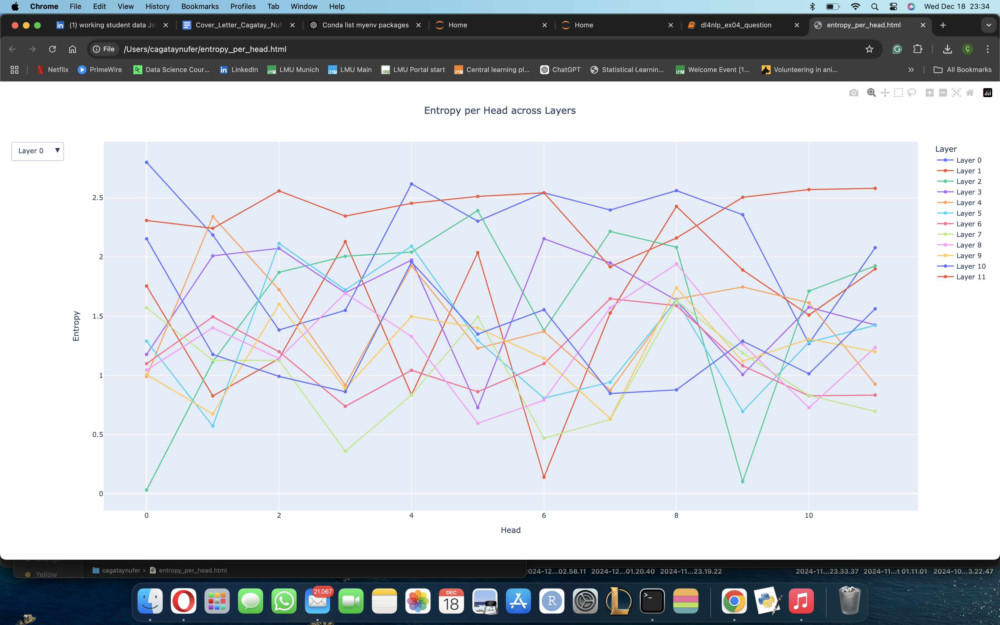



___

### Task 1.2.2: Importance Per Head

* After having seen how different attention heads correspond to different entropy levels, we can also calculate an [importance score](http://arxiv.org/abs/1905.10650) for each head
* For this experiment, we define a mask $\xi_{h}$, which can drop out (i.e. set to zero) an attention head
    * If the mask is not active (i.e. set to 1), the attention weights of the head remain unchanged (represented by $\xi_h$)
* Then, we feed in a sample $x$, calculate the loss $\mathcal{L}(x)$, and analyze the sensitivity of the loss w.r.t. the masked head
* The importance of that head follows as
$$
I_h = \big\vert \frac{\partial \mathcal{L}(x)}{\partial \xi_h} \big\vert
$$
* The absolute value avoids large negative and positive values from nullifying each other

* Define the `device` to use the GPU

In [16]:
device = torch.device("cuda")

* For this experiment, we will work with the [DAIR-AI Emotion Dataset](https://huggingface.co/datasets/dair-ai/emotion), but in this case you only need to load the `split='test'`
    * Select only the first 32 samples
    * Tokenize, pad, truncate to maximum 512 tokens, and return torch tensors of those 32 samples
    * Extract the labels of those 32 samples, too
    * This batch will serve as the exemplary classification dataset on which we calculate importance metrics


In [17]:
dataset = load_dataset("dair-ai/emotion", split = "test")
emotions = dataset.select(range(32))

tokenized_emotions = tokenizer_bert(
    emotions["text"],
    padding = "max_length",
    truncation = True,
    max_length = 512,
    return_tensors = "pt"
)

bert.to(device)

input_ids = tokenized_emotions["input_ids"].to(device)
attention_mask = tokenized_emotions["attention_mask"].to(device)
labels = torch.tensor(emotions["label"], dtype=torch.long).to(device)


* Then, we will write a function `get_head_importance`, which takes in the `model`, `samples`, `labels`, `device`, and an optional `mask`
* Define a zero-tensor of shape `[num_layers, num_heads]`, which stores the importance scores of all heads
* If no `mask` is provided, create a `mask` of ones (i.e. we are not masking anything currently) in the same shape
* In all cases, whether given or newly created, [enable gradient calculuation](https://pytorch.org/docs/stable/generated/torch.Tensor.requires_grad_.html) for the mask
* Move all necessary objects to the `device`
* Forward the samples through the model
    * Include the [labels](https://huggingface.co/docs/transformers/model_doc/bert#transformers.BertForSequenceClassification.forward.labels) and [head_mask](https://huggingface.co/docs/transformers/model_doc/bert#transformers.BertForSequenceClassification.forward.head_mask)
    * Extract loss and logits from the [output](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/output#transformers.modeling_outputs.SequenceClassifierOutput)
* Then, call `backward()` on the loss to distribute the gradients among the head mask
    * We do not train the model (i.e. no optimizer here), but we need the gradients (see formula above) for each head mask position w.r.t. each loss sample
    * PyTorch's autograd and `backward()` method allows us calculate and backpropagate any form of gradients, even without the classical training/optimization setup
* Now, we can check the head importance by accessing the [grad](https://pytorch.org/docs/stable/generated/torch.Tensor.grad.html) method of the earlier created `mask` tensor
    * [detach](https://pytorch.org/docs/stable/generated/torch.Tensor.detach.html) the tensor from the gradient calculation graph
    * Take the absolute value of it as shown in the formula
* It is common to normalize the head-importance scores in two ways
    * First, divide the head importance scores by the number of real (i.e. non-padding) tokens in the batch
    * Secondly, calculate the [l2-norm](https://mathworld.wolfram.com/L2-Norm.html) per layer
        * Make sure to adjust the shapes of the $l_2$ norm to fit the head importance tensor
        * Add a safety term of `1e-20` to the $l_2$ norm to avoid possible divisons by zero
        * Divide the head importance by the $l_2$ norm
* Return the head importance, logits, and labels

In [18]:
def get_head_importance(model, samples, labels, device, mask=None):
    num_layers = 12
    num_heads = 12

    tensor_0 = torch.zeros((num_layers,num_heads), device = device)

     # Mask of ones if no mask is provided
    if mask is None:
        mask = torch.ones((num_layers, num_heads), device=device)

    mask.requires_grad_()

    # Forward pass through the model
    output = model(**samples, labels=labels, head_mask=mask)
    loss = output.loss
    loss.backward()

    # Cases where mask.grad is None
    if mask.grad is not None:
        head_importance = mask.grad.detach().abs()
    else:
        # Default to zero importance if no gradient was propagated to mask
        head_importance = tensor_0

    head_importance = mask.grad.detach().abs()
    l2_norm = torch.sqrt(torch.sum(head_importance ** 2, dim=(0, 1)) + 1e-20)
    head_importance /= l2_norm

    return head_importance, output.logits, labels

* Calculate the head importance for our BERT model and the 32 samples

In [19]:
bert_head_importance, bert_logits, bert_labels = get_head_importance(model = bert, samples = {"input_ids" : input_ids, "attention_mask" : attention_mask}, labels = labels, device = device)

* Visualize the head importance in the same interactive way as you did with the entropy plots
* You can re-use `create_plotly_lineplot`, just create a DataFrame from the returned head importance tensor instead of the entropy tensor
* Comment on any trends you see in the importance of heads. Which head is the most important?
* Create again an HTML version of the plot and include a screenshot of your plot in the submission

In [20]:
df2 = pd.DataFrame(bert_head_importance.cpu().numpy())
df2.columns = [f"Layer {i}" for i in range(len(df2.columns))]
df2.index.name = "Head"

fig = create_plotly_lineplot(df2)
fig.update_layout(
    title={
        "text": fig.layout.title.text.replace("Entropy", "Importance"),
        "x": 0.5,
    }
)
fig.show()


/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



___
Student answers here:From the analysis of the importance scores, the most critical head appears to be Head 8 in Layer 10, as it shows the highest importance score across all layers. This indicates that it likely plays a specialized role in the model's computations. Overall, importance scores vary significantly, with some layers, like Layer 10, having a dominant head, while other layers show a more distributed pattern of importance among their heads. Many heads consistently exhibit low importance, suggesting potential redundancy and making them candidates for pruning without significantly impacting the model's performance. These results highlight that while some heads are essential for specific tasks, others may contribute less, reflecting the specialized and sometimes redundant nature of attention heads.

___

* Investigate whether there is a positive, negative, or no correlation between each attention head's entropy and importance score
* Calculate the [correlation coefficient](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between the entropies and importance scores
* Create a scatter plot to visualize your findings
* Comment on the results

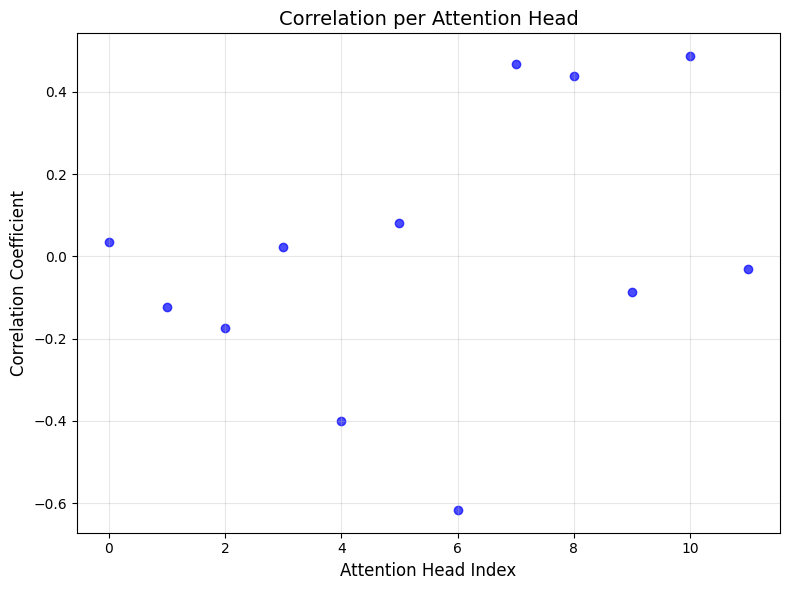

In [21]:
df_correlation = pd.DataFrame(index=df.index, columns=["Correlation"])

# Looping through each head
for head in df.index:
    # Entropy and importance values across all layers for the current head
    entropy_values = df.loc[head, :].values
    importance_values = df2.loc[head, :].values

    # The correlation coefficient for the current head
    correlation = np.corrcoef(entropy_values, importance_values)[0, 1]

    df_correlation.loc[head, "Correlation"] = correlation

plt.figure(figsize=(8, 6))

plt.scatter(df_correlation.index, df_correlation["Correlation"], color="blue", alpha=0.7)

plt.title("Correlation per Attention Head", fontsize=14)
plt.xlabel("Attention Head Index", fontsize=12)
plt.ylabel("Correlation Coefficient", fontsize=12)
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()




___
Student answers here:
The correlation between entropy and importance for attention heads provides insights into how diversity in attention patterns relates to their significance in the model's performance. Heads with a positive correlation indicate that higher entropy, or more diverse attention, corresponds to greater importance, suggesting these heads contribute significantly to the task. Conversely, heads with a negative correlation show that higher entropy is associated with lower importance, implying these heads may be less focused or redundant in their contributions. Heads with near-zero correlation suggest no strong relationship between entropy and importance, indicating that attention diversity may not directly impact their utility. Overall, the plot helps identify critical heads that play a key role in the model and others that might be pruned or examined further for optimization.
___

### Task 1.2.3: Masking and Pruning Heads

* As we can see from the line and scatter plots, a lot of attention heads have an importance of near 0
* As a consequence, we can investigate which and how many we can remove from our model without losing a predefined threshold of performance
* Dropping attention heads leads to dropping parameters, which results in a smaller model for further finetuning or inference
* However, directly dropping heads is risky, since dropping a head affects the calculations and, therefore, the performance of the remaining model
* Therefore, we remove heads through masking consecutively and test the performance after each removed head
* Once we found an acceptable performance-masking tradeoff, we can actually remove the heads from the model

* Write a function that takes in a `model`, `samples`, `labels`, `threshold` and `device`
* Start again with an inactive mask
* Set the starting head importance, logits, and labels
* Use logits and labels to calculate a base accuracy performance with the inactive mask
* We perform the following process until either the accuracy dropped more than 5% (i.e. threshold level) below starting accuracy, or until all heads are masked
    * We continuously select the next lowest importance head
    * We mask its position in the mask
    * Recalculate the head importance and accuracy level with the masked heads
      * Hint: Depending on your implementation, you might find [clone](https://pytorch.org/docs/stable/generated/torch.clone.html) and/or [detach](https://pytorch.org/docs/stable/generated/torch.Tensor.detach.html) helpful when dealing with the `mask` and/or `head_importance`
    * Set the head's importance to positive infinity so that it will always be last in future importance rankings
* Save the number of masked heads with the corresponding accuracy level for each iteration as a tuple `(int, float)` in a list
    * The accuracy should be rounded to 4 decimal places
* The function returns the final `mask` and the list of tuples

In [26]:
def find_min_heads(model, samples, labels, threshold, device):
    # Set the initial mask to ones (no heads are masked)
    mask = torch.ones((12, 12), device=device, requires_grad=False)

    # Get initial head importance and model predictions
    head_importance, logits, _ = get_head_importance(
        model=model,
        samples=samples,
        labels=labels,
        device=device,
        mask=mask
    )

    # Calculate the base accuracy
    base_accuracy = (logits.argmax(dim=-1) == labels).float().mean().item()

    results = []

    max_iterations = 144

    while len(results) < max_iterations:
        # Identifying the least important head
        min_idx = torch.argmin(head_importance)
        layer_idx, head_idx = divmod(min_idx.item(), head_importance.size(1))

        # Creating an updated mask by masking the least important head
        updated_mask = mask.clone().detach()
        updated_mask[layer_idx, head_idx] = 0

        # Updating the mask
        mask = updated_mask.clone().detach()

        # Recalculate head importance and model predictions
        head_importance, logits, _ = get_head_importance(
            model=model,
            samples=samples,
            labels=labels,
            device=device,
            mask=mask
        )

        # Calculateing accuracies with the updated mask
        accuracy = (logits.argmax(dim=-1) == labels).float().mean().item()
        accuracy = round(accuracy, 4)

        # Appending the result
        results.append((mask.numel() - mask.sum().item(), accuracy))

        # Stop if accuracy drops below the threshold or all heads are masked
        if accuracy < base_accuracy - threshold or mask.sum().item() == 0:
            break

        # Marking the least important head as used by setting its importance to infinity
        head_importance[layer_idx, head_idx] = float('inf')

    return mask, results


* Find the minimum number of heads required before performance drops below the given 5% threshold
* Plot the accuracy level per number of masked heads below
* Comment on your findings
    * Keep in mind that we are evaluating on a very small set of 32 samples
        * I.e extreme results are possible, such as masking large percentages of the model's heads without noticing performance differences
    * It is possible that the accuracy can rise intermediately, even though heads are dropped. Try to explain what is happening in such cases.
    * In practice, you would usually run this experiment on the whole [GLUE dataset](https://huggingface.co/datasets/glue) to have a more representative and diverse accuracy baseline

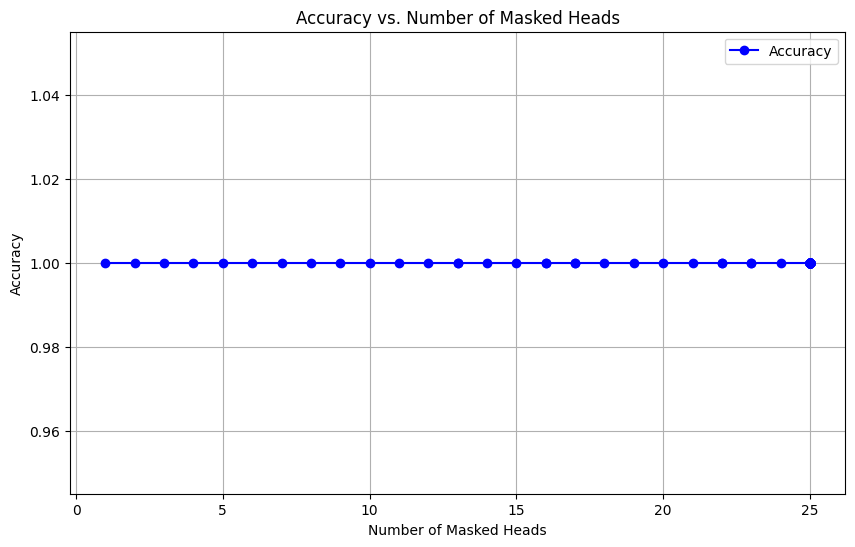

In [29]:
pruned_mask, eval_results = find_min_heads(bert, samples = {"input_ids": input_ids, "attention_mask": attention_mask}, labels = labels, threshold = 0.05, device = device)

masked_heads, accuracies = zip(*eval_results)

plt.figure(figsize=(10, 6))
plt.plot(masked_heads, accuracies, marker='o', linestyle='-', color='b', label='Accuracy')

plt.xlabel('Number of Masked Heads')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Masked Heads')
plt.legend()
plt.grid(True)
plt.show()

___
Student answers here:Unfortunately, I believe I am either observing an extreme result or there is a problem with my code as accuracy is 1 accross any number of masked heads. This also can be due to the small sample size. However, to still answer the question, rising accuracy levels with more dropped heads can be explained with multiple heads focusing on similar patterns or relationships in the data. Dropping a head with low importance can reduce redundancy, forcing the remaining heads to reallocate their attention more effectively, thereby improving overall focus and potentially boosting accuracy in the short term.
___

* Now that we have our mask, we can actually remove from the model the heads we masked before (pruning)
* Create a dictionary that [maps each layer's index to the indices of the heads to prune](https://huggingface.co/docs/transformers/main_classes/model#transformers.PreTrainedModel.prune_heads)
* Calculate the number of parameters before and after pruning to show the effect
    * Note that the `prune_heads` method changes the model in-place

In [30]:
def prune_the_heads(model, final_mask):
    heads_to_prune = {}

    for layer_idx in range(final_mask.size(0)):
        heads_to_prune[layer_idx] = (final_mask[layer_idx] == 0).nonzero(as_tuple=True)[0].tolist()

    # no of Params before pruning
    num_params_before = sum(p.numel() for p in model.parameters())

    # Pruning
    model.prune_heads(heads_to_prune)

    # no of Params after pruning
    num_params_after = sum(p.numel() for p in model.parameters())

    return heads_to_prune, num_params_before, num_params_after

pruned_heads, params_before, params_after = prune_the_heads(bert, pruned_mask)

print(f"Number of params before: {params_before}")
print("-" * 111)
print(f"Number of params after: {params_after}")

Number of params before: 109486854
---------------------------------------------------------------------------------------------------------------
Number of params after: 104566854


# Task 2: Decoding

* In the following, we will have a look at various ways of generating text from model output probabilities
* Specifically, we will see how much of an impact the decoding strategy has on the generated text
* Using Hugging Face, we will try both basic and more advanced as well as commonly used decoding strategies for the same input prompt
* Therefore, we can see and analyze the shortcomings and advantages of various decoding strategies *while keeping the model and prompt equal*

In [31]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM

* Define the device for decoding
* Load GPT-2 with its language modeling head and the corresponding tokenizer
    * Since we are doing open ended text generation, there is no padding token necessary
    * To disable the warning by the model, you can set `pad_token_id=tokenizer.eos_token_id` inside the `from_pretrained` model loading process
    * Set it into eval mode

In [32]:
device =  torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = AutoTokenizer.from_pretrained("gpt2")
model = AutoModelForCausalLM.from_pretrained("gpt2", pad_token_id=tokenizer.eos_token_id)
model.to(device)
model.eval()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)

## Task 2.1: Greedy Search

* Greedy search is the most straightforward method for generating sequences
* Starting from an initial context, e.g. a prompt, the model generates the next token in the sequence by selecting the token that has the highest predicted probability according to the model
* The selected token is added to the sequence, and the process is repeated to generate the entire sequence
* Importantly, in each step the model *only* considers the most likely token based on its current context
* Greedy search is deterministic, meaning it always chooses the same token given the current context
* The decoding algorithm continues until the set maximum generated length has been reached, or until the end-token has been generated

* Given the sentence below:
    * Tokenize the prompt
    * Generate the output using [model.generate()](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/text_generation#transformers.GenerationMixin.generate)
        * Limit the generation length to 128 tokens
    * Decode the generated output to a human readable format
    * Discuss the quality of output. Relate the possible advantages and disadvantages of the output to the algorithm used.

In [33]:
sentence = "I came back from holidays and"

tokenized_sentence = tokenizer(sentence, return_tensors = "pt")["input_ids"].to(device)

generated_output = model.generate(
    input_ids=tokenized_sentence,
    max_length=128,
    pad_token_id=tokenizer.eos_token_id
)

# Decoding
decoded_output = tokenizer.decode(generated_output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays and I was like, 'Oh my God, I'm so excited to be back in the States.' I was like, 'Oh my God, I'm so excited to be back in the States.' I was like, 'Oh my God, I'm so excited to be back in the States.' I was like, 'Oh my God, I'm so excited to be back in the States.' I was like, 'Oh my God, I'm so excited to be back in the States.' I was like, 'Oh my God, I'm so excited to be back in the States.' I was


___
Student answers here:
Greedy search generates output by selecting the most probable token at each step, which ensures a deterministic and straightforward decoding process. However, this method can lead to repetitive outputs, as seen in the generated sequence where the phrase 'Oh my God, I'm so excited to be back in the States' is repeated. This happens because greedy search lacks a mechanism to consider alternative completions or penalize repeated phrases. While it ensures consistency by always choosing the highest-probability tokens, it often sacrifices diversity and coherence in longer outputs, especially when the model's predictions get trapped in repetitive patterns.

___

## Task 2.2: Beam search

* Beam search is an extension of greedy search and aims to overcome some of its limitations
* Starting from an initial context, the model generates multiple candidate tokens for the next position, typically referred to as "beams"
* Each beam represents a hypothesis for the next token in the sequence
* The model scores and ranks these beams based on their predicted probabilities
* The top-k beams with the highest scores are selected to continue the generation process, where k is a user-defined parameter known as the "beam width"
* The selected beams are extended with candidate tokens, and the process is repeated iteratively
* Beam search maintains multiple active hypotheses in parallel, allowing it to optimize coherence in the sequence across multiple paths
* Decoding continues until one or more beams generate an end token or reach the maximum sequence length

* In the following, we will implement (a simplified version of) the beam search algorithm, and compare it to Hugging Face's implementation of beam search
    * Hint: Aside from efficiency tweaks, we do not include any length bonus or penalization of short sequences, as you may later notice (depending on the prompt)
* First, we define a helper function called `generate_candidates`, which will generate our possible next token along each hypothesis path
    * It takes as input the `model`, the `context`, which is the tokenized prompt, the so far newly generated `sequence`, the `beam_width`, and the `device`
    * The model predicts logits based on the concatenated context and sequence
    * We extract the last predicted token position of the logits, which serves as the next token prediction
    * From this hidden representation, we return the top-k indices of the vocabulary, whereas the `beam_width` parameter determines the $k$
    * Make sure to place everything on the `device` as required
* The main `beam_search` function takes as input the `model`, `context`, `beam_width`, `max_length`, and `device`
    * Create a data structure `hypotheses` that holds all of the newly generated sequences along with their log-probability scores
    * In our simplified version, we generate new tokens until the maximum length is reached
    * In each step, we iterate through all hypotheses
    * Each hypothesis generates candidates with our above helper function based on the current progress of newly generated sequences
        * In the first iteration, this newly generated sequence is simply empty (it is not necessary to consider start tokens here)
        * As a result, we generate the first new token only based on the provided `context`
    * Next, we extend the hypothesis step by step with each candidate token
        * Each extension is paired with the initial context and put through the model
        * Then, we calculate log-probabilities for each position in the vocabulary and extract the candidate position
        * This log-probability is stored together with the hypthesis and extended/summed up with each new candidate token and log-probability
        * Save all scored hypothesis and candidate combinations
    * Based on all hypothesis combinations, extract the top-`beam_width` number of combinations based on the highest scores
    * Overwrite the earlier created `hypotheses` datastructure with those top-`beam_width` hypotheses, so that we start the next iteration with `beam_width`-many hypotheses
    * When `max_length` token have been generated, return the combined indices of the initial context and the generated ones
    * Disable gradient calculation and move everything to `device` as necessary
* Use the function with `beam_width=5` and `max_length=50` to generate the output, then decode it as done above.

In [34]:
def generate_candidates(model, context, sequence, beam_width, device):
    input_ids = torch.cat((context, sequence), dim=-1).to(device)

    # Generating logits from the model
    with torch.no_grad():
        logits = model(input_ids).logits

    # Extracting the logits for the last predicted token position
    last_logits = logits[:, -1, :]

    # Top-k token indices and their scores
    topk_scores, topk_indices = torch.topk(torch.nn.functional.log_softmax(last_logits, dim=-1), beam_width, dim=-1)

    return topk_indices, topk_scores

In [35]:
def beam_search(model, context, beam_width, max_length, device):
    # Initial hypotheses: sequences with empty continuation and a log-probability of 0
    hypotheses = [(context, 0.0)]

    for _ in range(max_length):
        # Temporary storage for new hypotheses
        new_hypotheses = []

        for sequence, score in hypotheses:
            # Generating candidates for the current sequence
            topk_indices, topk_scores = generate_candidates(model, context, sequence, beam_width, device)

            # Extending each hypothesis with the generated candidates
            for i in range(beam_width):
                next_token = topk_indices[0, i].unsqueeze(0).unsqueeze(0)  # Adding batch and sequence dimensions
                next_score = topk_scores[0, i].item()

                # Extending the sequence with the new token
                extended_sequence = torch.cat((sequence, next_token), dim=-1).to(device)

                # Updating the log-probability score
                updated_score = score + next_score

                # Adding the new hypothesis to the temporary list
                new_hypotheses.append((extended_sequence, updated_score))

        # Sorting all hypotheses by score and keeping the top beam_width ones
        new_hypotheses = sorted(new_hypotheses, key=lambda x: x[1], reverse=True)[:beam_width]

        # Updating the hypotheses for the next iteration
        hypotheses = new_hypotheses

    # Returns the best hypothesis
    best_sequence = hypotheses[0][0]
    return best_sequence

In [36]:
output = beam_search(model = model, context = tokenized_sentence, beam_width = 5, max_length = 50, device = device)

# Decoding
decoded_output = tokenizer.decode(output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came back from holidays andI came


* Now repeat the beam search process using [model.generate()](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/text_generation#transformers.GenerationMixin.generate)
    * Limit the generation length to 128 tokens
    * To choose beam search, set `num_beams=5` and `early_stopping=True`
* Decode the generated output to a human readable format
* Discuss the quality of our simplified beam search output and Hugging Face's output. Relate the possible advantages and disadvantages of the output to the algorithm used.

In [37]:
huggingface_output = model.generate(
    input_ids=tokenized_sentence,
    max_length=128,
    num_beams=5,
    early_stopping=True,
    pad_token_id=tokenizer.eos_token_id
)

# Decoding
decoded_output = tokenizer.decode(huggingface_output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays and I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my gosh, I'm so glad I did that.' And I was like, 'Oh my g


___
Student answers here:The simplified beam search output exhibits repetitive patterns, repeating "I came back from holidays" continuously, suggesting that the approach lacks mechanisms to avoid redundancy or evaluate longer-term coherence effectively. On the other hand, Hugging Face's beam search generates a slightly more meaningful continuation, introducing the phrase "Oh my gosh, I'm so glad I did that." However, it still contains noticeable repetition, implying that beam search alone cannot fully mitigate repetitive sequences without additional constraints. Hugging Face's implementation benefits from built-in options like early_stopping and parameter tuning, which enhance the generation process by promoting a balance between coherence and diversity, though it doesn't eliminate the repetition entirely.
___

* In order to specifically reduce repetitions, beam search can be adapted with a `no_repeat_ngram_size=2` option
    * This prevents the model from generating any ngrams of size 2 twice
* Generate its output using the option and discuss the new results again. When can this option be useful? In which case does it (always) deteriorate the output?

In [38]:
huggingface_ngrams_output = model.generate(
    input_ids=tokenized_sentence,
    max_length=128,
    num_beams=5,
    early_stopping=True,
    no_repeat_ngram_size=2,
    pad_token_id=tokenizer.eos_token_id
)

# Decoding
decoded_output = tokenizer.decode(huggingface_ngrams_output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays and I was like, 'Oh my gosh, I'm so glad I did it.' And then I went back to work and it was just so much fun.

"It's been a long time since I've done anything like this, but I think it's great to be able to do it again."


___
Student answers here: This output demonstrates the most coherent and natural progression compared to previous methods. The use of no_repeat_ngram_size=2 effectively eliminates repetition in the generated text, leading to more diverse and engaging results. The additional tuning, such as early_stopping, further refines the balance between coherence and creativity. This approach is particularly valuable for tasks requiring consistent and varied text generation. It would always deteriorate the output for tasks that are inherently repetitive, such as legal and structured documents.

___

## Task 2.3: Sampling
* Sampling decoding is probabilistic approach for generating sequences of tokens
* Starting from an initial context, the model generates the next token in the sequence by randomly sampling from the distribution of predicted token probabilities
* Instead of deterministically selecting the most likely token as in greedy search, sampling decoding introduces randomness by considering the predicted probabilities as a probability distribution
* The model assigns probabilities to each possible token, and the next token is chosen probabilistically based on these probabilities
* Tokens with higher probabilities are more likely to be selected, but there is still an element of randomness involved
* Sampling decoding can be guided by a temperature parameter, where higher temperatures increases the likelihood of highly probable words, and lower temperatures smoothes out the distribution
* The decoding continues iteratively, with each token influencing the distribution of probabilities for the next token.
* The process is repeated until an end token is generated, or the maximum sequence length is reached

* Generate the output using [model.generate()](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/text_generation#transformers.GenerationMixin.generate)
    * Limit the generation length to 128 tokens
    * To choose sampling decoding, activate `do_sample=True`, set `top_k=0` and set the temperature e.g. to `temperature=0.6`
* Decode the generated output to a human readable format
* Discuss the quality of output. Relate the possible advantages and disadvantages of the output to the algorithm used.

In [39]:
sampling_output = model.generate(
    input_ids=tokenized_sentence,
    max_length=128,
    do_sample=True,
    top_k=0,
    temperature=0.6,
    pad_token_id=tokenizer.eos_token_id
)

# Decoding
decoded_output = tokenizer.decode(sampling_output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays and had a lot of fun. I was excited to get a job and move back to the U.S. to have a family. I didn't have a lot of jobs, so I had to be a part of something for a little while. I wanted to get a job in a restaurant, but I didn't have a lot of money to do it. This was the first time I had a job, so I was really excited to be part of something like this."

"I was looking forward to the day when I had a career," DeBoer said. "I was looking forward


___
Student answers here:
The generated output using sampling decoding demonstrates the method’s probabilistic nature. Unlike deterministic algorithms, such as greedy search, sampling allows randomness in token selection based on probability distributions, guided here by a temperature of 0.6. This results in more diverse and creative outputs. The narrative flow introduces a broader range of content, but it also leads to some disjointed or unexpected transitions, as seen in the text referencing unrelated details.

___

## Task 2.4: Top-K Sampling

* Top-k sampling amends the above sampling approach by considering only a restricted set of the most likely tokens per step
* Instead of sampling from the entire vocabulary of possible tokens, top-k sampling limits the selection to the top-k tokens with the highest predicted probabilities
* K is a user-defined parameter and determines the size of the set of candidates
* The model assigns probabilities to each possible token, ranks them based on their predicted probabilities, and selects from the top-k tokens for the next position in the sequence
* This approach combines randomness within a the restricted set of candidates
* Tokens within the top-k can still be selected probabilistically, with tokens having higher probabilities being more likely to be chosen
* The decoding continues iteratively until and end token is generated, or the maximum sequence length is reached

* Generate the output using [model.generate()](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/text_generation#transformers.GenerationMixin.generate)
    * Limit the generation length to 128 tokens
    * To choose top-k sampling decoding, activate `do_sample=True` and set `top_k=50`
* Decode the generated output to a human readable format
* Discuss the quality of output. Relate the possible advantages and disadvantages of the output to the algorithm used.

In [40]:
topk_output = model.generate(
    input_ids=tokenized_sentence,
    max_length=128,
    do_sample=True,
    top_k=50,
    pad_token_id=tokenizer.eos_token_id
)

# Decoding
decoded_output = tokenizer.decode(topk_output[0], skip_special_tokens=True)

print(decoded_output)

I came back from holidays and I got a little sore." When he was asked what happened afterwards, Eman said nothing and told his story to the board.

"I went in and said it wouldn't be the first time. I told you nothing on the other side as I knew this was something I had to see the same story over the phone at some point and I still don't think it's something I should have said at all," said Regan.

In the days following the incident, Eman says his lawyer tried to convince him he might not have had to take out that loan.

"It


___
Student answers here:The output generated using top-k sampling reflects a balance between randomness and coherence. By restricting the selection to the top 50 tokens with the highest probabilities, the method reduces the likelihood of absurd or irrelevant token choices while still maintaining diversity. The generated text shows some coherence, with smoother transitions compared to unrestricted sampling. However, certain sections, such as references to unrelated people like "Eman" and his lawyer, indicate that the model occasionally loses contextual consistency.

___

## Bonus: Contrastive Search (bonus)

* [Contrastive search](https://arxiv.org/abs/2202.06417) addresses text generation issues by introducing a learnable decoding framework constisting of two components
* Contrastive Training: **Sim**ple **c**ontrastive framework for neural **t**ext **g**eneration (SimCTG)
    * Aims to improve the quality of token representations generated by language models
    * It trains the model to learn discriminative token representations
    * This greatly assists the model to produce more coherent and contextually relevant text
* Contrastive Search:
    * Complements CTG by first calculating a confidence score among the top-k candidate tokens represented by the model probabilities
    * Then, a degeneration penalty is introduced
    * It measures how discriminative the top-k candidate tokens are w.r.t. the previous context
    * The cosine similarity is used as a measure
    * The larger the degeneration penalty score is, the more similar the next token is to the previous context, and the more likely it is that the output degenerates
* A hyperparameter $\alpha$ regulates the tradeoff between the model confidence and the degeneration penalty
    * If $\alpha=0$, greedy search is performed

* In terms of performance, contrastive search was a big step up over previous algorithms
* However, the algorithm was only recently implemented in the Transformers library (i.e. not available in the 4.19.4 version we used before)
* If you want to try it, install versions >=4.33
    * Depending on the prompt, the sequence could be more relevant and coherent, as well as less repetitive
    * However, due to our very small model size, the answers might still be very repetitive and less coherent, but that is the model's fault in this case
    * See [here](https://github.com/huggingface/transformers/issues/19182#demonstration) for some impressive demonstrations with OPT-6.7b and contrastive search vs. OPT-175b and nucleus sampling (another version top-k sampling)

Bonus: Code is given, simply try it out if you want
* Generate the output using [model.generate()](https://huggingface.co/docs/transformers/v4.33.0/en/main_classes/text_generation#transformers.GenerationMixin.generate)
    * Limit the generation length to 128 tokens
    * To choose contrastive search, set `penalty_alpha=0.6`, `top_k=4`, and allow `max_new_tokens=128`
* Decode the generated output to a human readable format
* Discuss the quality of output. Relate the possible advantages and disadvantages of the output to the algorithm used.

```
contrastive_out = model.generate(**tokenized, penalty_alpha=0.6, top_k=4, max_new_tokens=128)
contrastive_decoded = tokenizer.decode(contrastive_out[0], skip_special_tokens=True)
print('Contrastive search result:')
print(contrastive_decoded)
```

In [41]:
contrastive_out = model.generate(tokenized_sentence, penalty_alpha=0.6, top_k=4, max_new_tokens=128)
contrastive_decoded = tokenizer.decode(contrastive_out[0], skip_special_tokens=True)
print('Contrastive search result:')
print(contrastive_decoded)

Contrastive search result:
I came back from holidays and I was like, 'Oh my God, I don't know what to do with this.'"

"I was like, 'I'm going to have to go to the hospital and get my life back.' "

"I was like, 'I'm going to have to go to the hospital and get my life back.' "

"I was like, 'I'm going to have to go to the hospital and get my life back.' "

"I was like, 'I'm going to have to go to the hospital and get my life back.' "

"I was like, 'I


Student Answer Here:
The output from contrastive search shows some clear repetition, with the phrase "I'm going to have to go to the hospital and get my life back" being repeated multiple times. This happens because the model used is small and doesn't have strong enough token representations to properly balance coherence and diversity. Contrastive search tries to avoid repetition by combining confidence scoring with a penalty for choosing tokens that are too similar to the previous context. However, for smaller models, this approach doesn’t work as well since the model can’t fully understand the context or generate diverse tokens. While contrastive search works well with larger models, it struggles with smaller ones, leading to repetitive and less meaningful outputs.